<a href="https://colab.research.google.com/github/jsansao/idl/blob/main/Licao29bis_Treinamento_NanoYOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lição 29bis - Treinamento do YOLOv8 para dataset próprio



Nessa lição, vamos mostrar como treinar o YOLOv8 para detectar objetos de um dataset próprio.

Vamos usar o dataset das peças de Xadrez usado em lição anterior, fornecido pela Roboflow e hospedado no github.

O dataset está no formato do YOLO, que difere dos formatos COCO e PASCAL VOC.  

# Passo 1: Instalação

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 7.4 MB/s eta 0:00:00


In [2]:
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.7/78.2 GB disk)


In [3]:
from ultralytics import YOLO

from IPython.display import display, Image

# Passo 2: Download do dataset

In [4]:
!wget https://github.com/jsansao/MaskWearing_YoloV5/archive/refs/heads/main.zip -O Masks.zip
!unzip Masks.zip -d /content/
!mv /content/MaskWearing_YOLOv5-main/* /content/


--2023-11-14 19:36:45--  https://github.com/jsansao/MaskWearing_YoloV5/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/jsansao/MaskWearing_YOLOv5/zip/refs/heads/main [following]
--2023-11-14 19:36:46--  https://codeload.github.com/jsansao/MaskWearing_YOLOv5/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.121.10
Connecting to codeload.github.com (codeload.github.com)|140.82.121.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘Masks.zip’

Masks.zip               [          <=>       ]  50.03M  18.3MB/s    in 2.7s    

2023-11-14 19:36:49 (18.3 MB/s) - ‘Masks.zip’ saved [52464773]

Archive:  Masks.zip
8935956a7c3ce9fe41b38ca2bd3f82edfdeafb2e
   creating: /content/MaskWearing_YOLOv5-main/
  inflating: /

## Passo 3: Treinamento do modelo no YOLOv5

Podemos definir alguns parâmetros:

- **img:** tamanho da imagem de entrada
- **batch:** tamanho do lote
- **epochs:** Épocas de treinamento. (Note: often, 3000+ are common here!)
- **data:** Caminho do dataset
- **weights:** Inicialização dos pesos. No exemplo, usamos o modelo COCO pretreinado.
- **cache:** Faz cache das imagens para aceleração do processamento


É possível usar diferentes modelos pré-treinados, com diferentes tamanhos e requisitos computacionais para inferência.

Veja tabela:


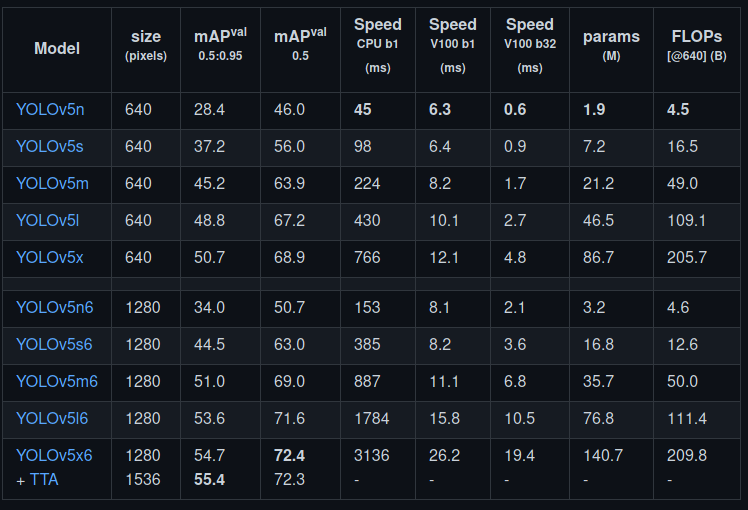

In [5]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/data.yaml epochs=25 imgsz=800 plots=True

100% 21.5M/21.5M [00:00<00:00, 303MB/s]
Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, forma

# Avaliação de desempenho do YOLOv8


In [6]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Infererência com os pesos treinados:

Roda a inferência no conteúdo do diretório `test/images/`


In [7]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source=/content/test/images save=True

Ultralytics YOLOv8.0.209 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

image 1/15 /content/test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.5633f5fe7a9b926101b7fc16615dfb6a.jpg: 448x800 3 masks, 109.6ms
image 2/15 /content/test/images/1224331650_g_400-w_g_jpg.rf.483a35a2395bf48e96783587a59fe876.jpg: 768x800 4 masks, 71.1ms
image 3/15 /content/test/images/126202-untitled-design-13_jpg.rf.baa3d2e55d469ae5d5d4cd81c4603e1d.jpg: 448x800 5 masks, 15.6ms
image 4/15 /content/test/images/1288126-10255706714jpg_jpg.rf.ed230c79fdbb1fa0650ff4fd32f620ee.jpg: 544x800 2 masks, 58.8ms
image 5/15 /content/test/images/15391513324714o1n0r10n6_jpg.rf.eb6b6b796ad74b0c9d75011d1020f0af.jpg: 800x544 1 mask, 63.3ms
image 6/15 /content/test/images/15391513329330sooq10859_jpg.rf.bf9e791012521a572a3a7f2979d0dffe.jpg: 800x544 1 mask, 18.7ms
image 7/15 /content/test/images/1579924271_jpg.rf.1fea0f43731fb

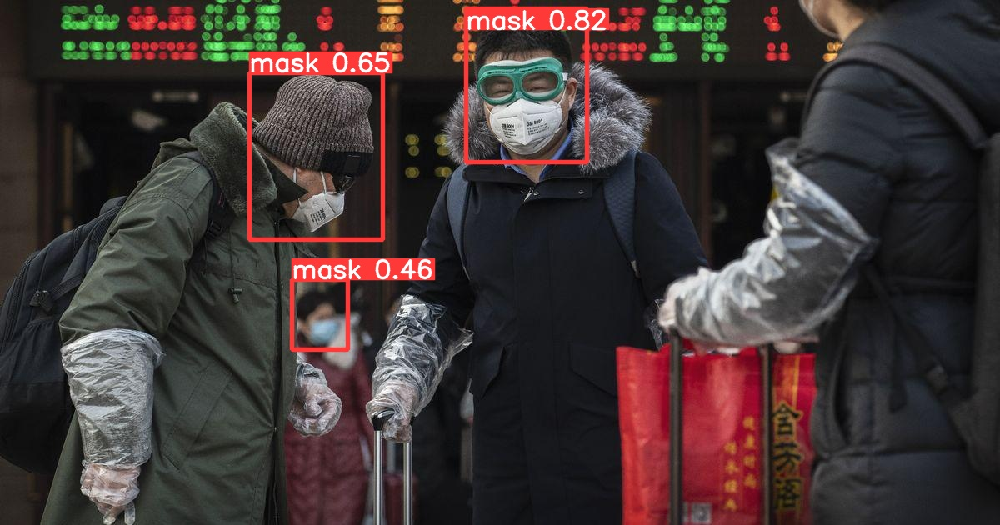

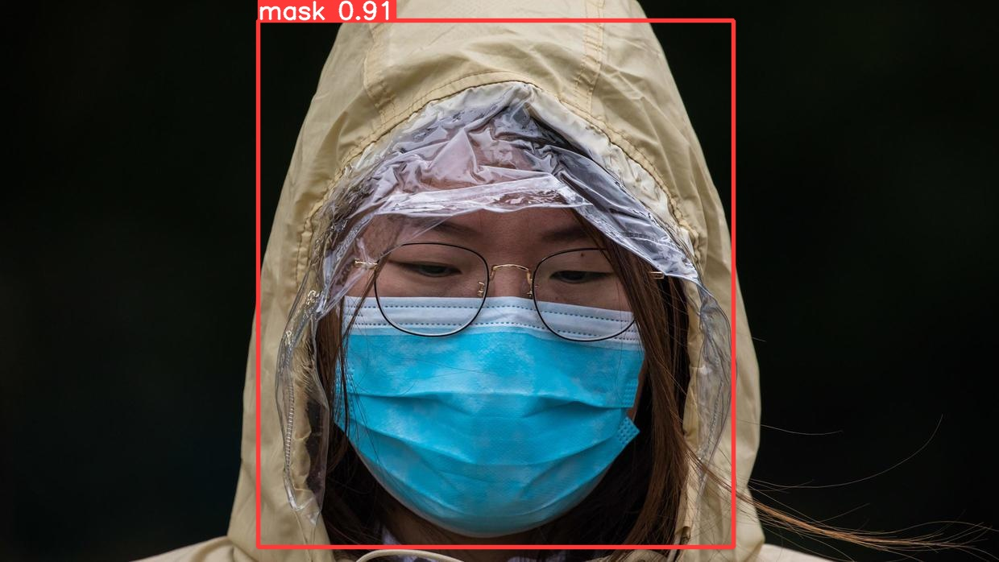

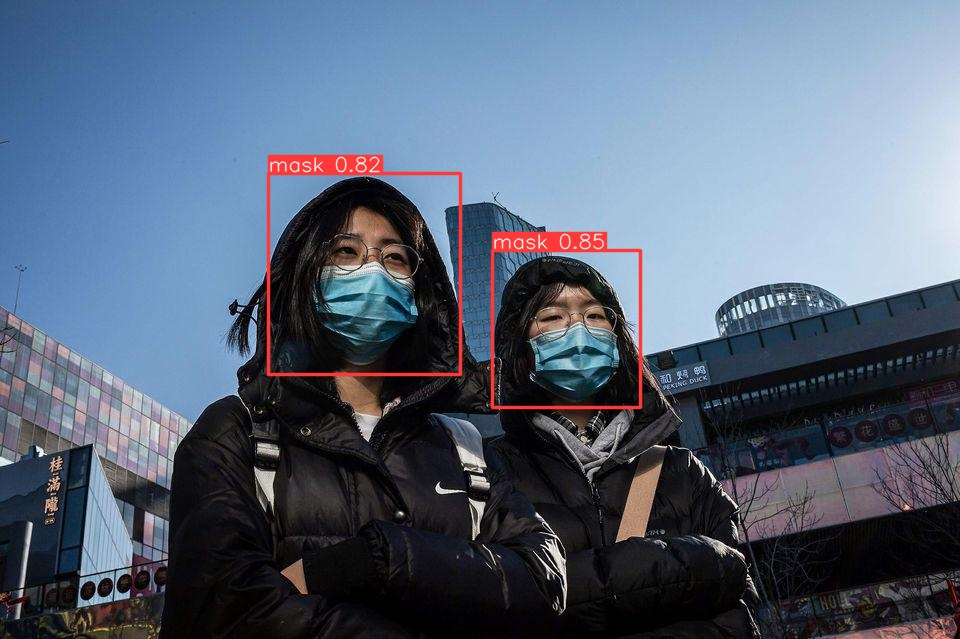

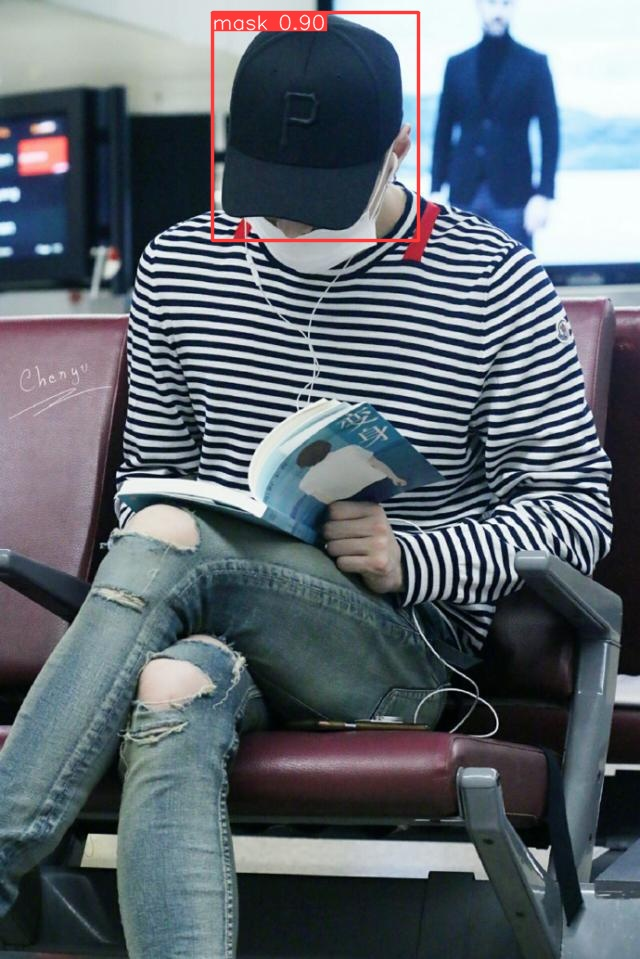

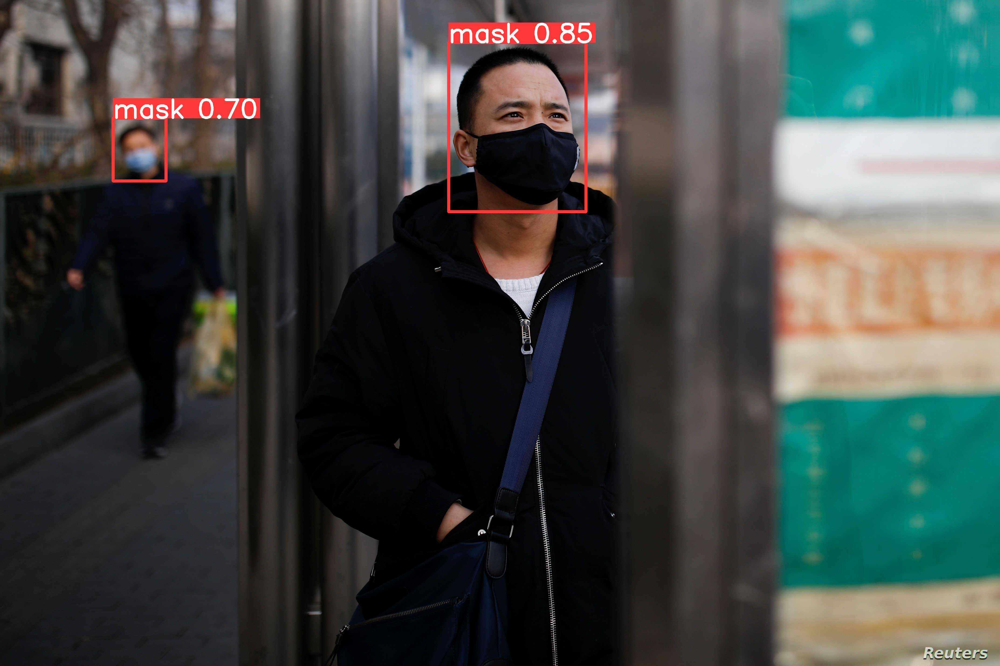

...

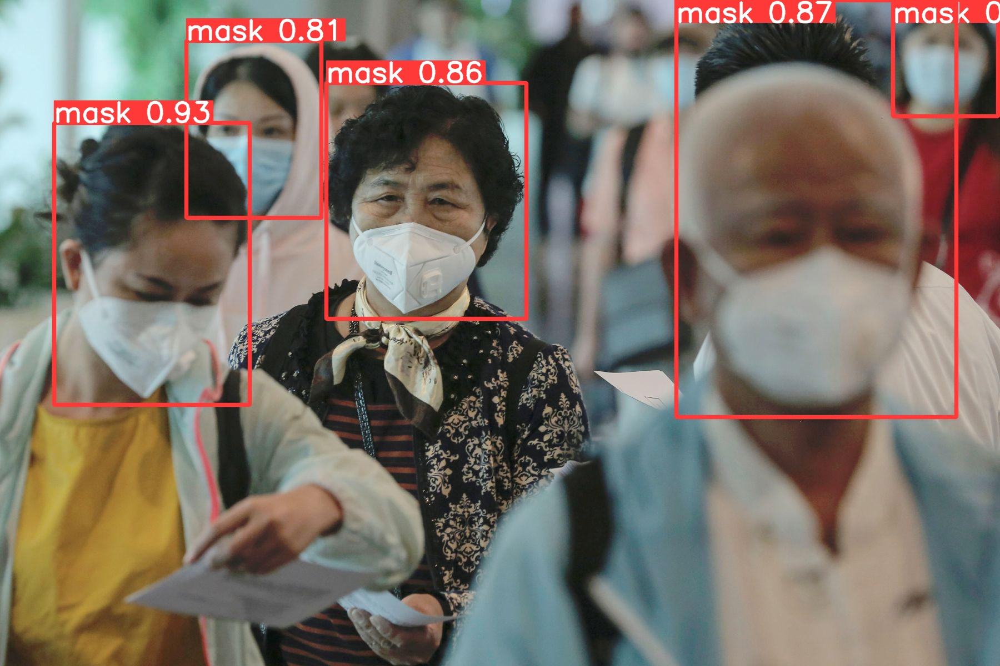

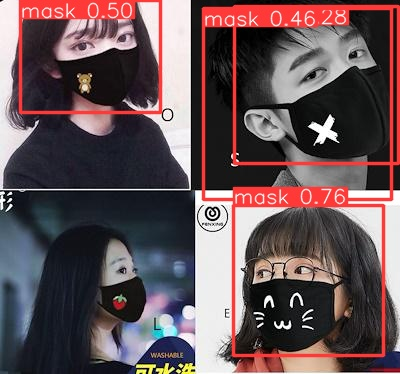

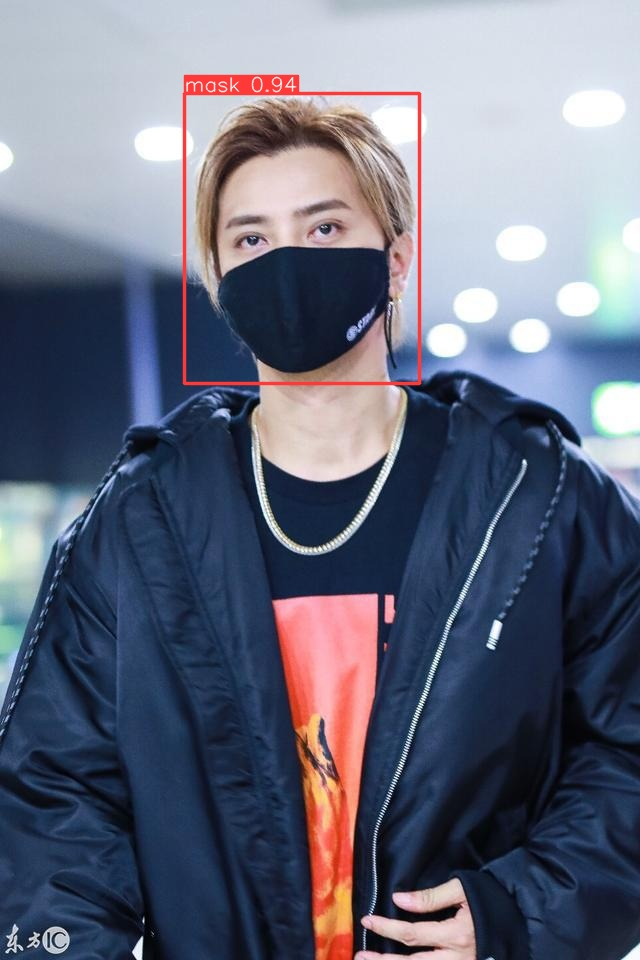

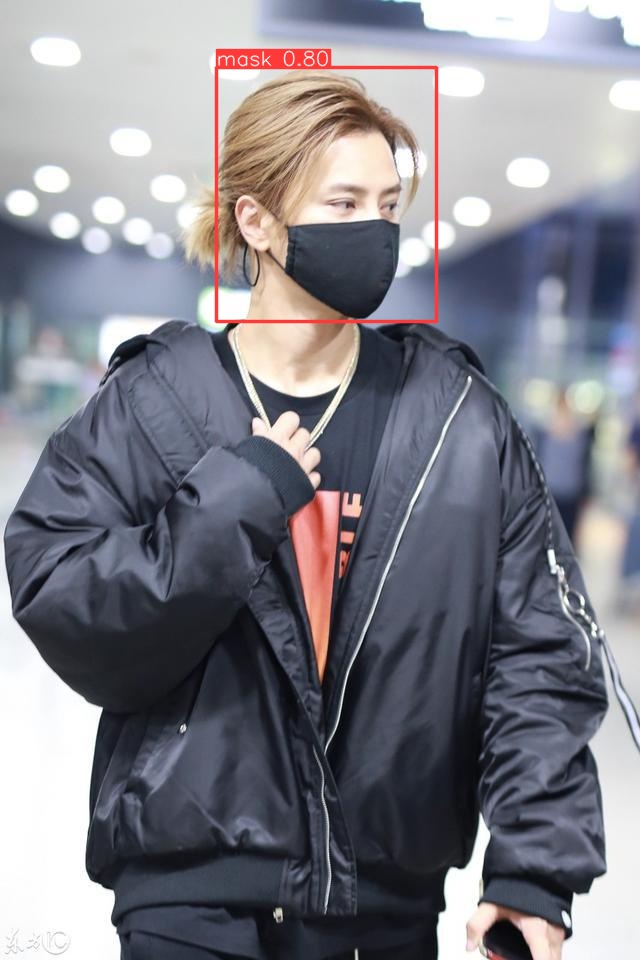

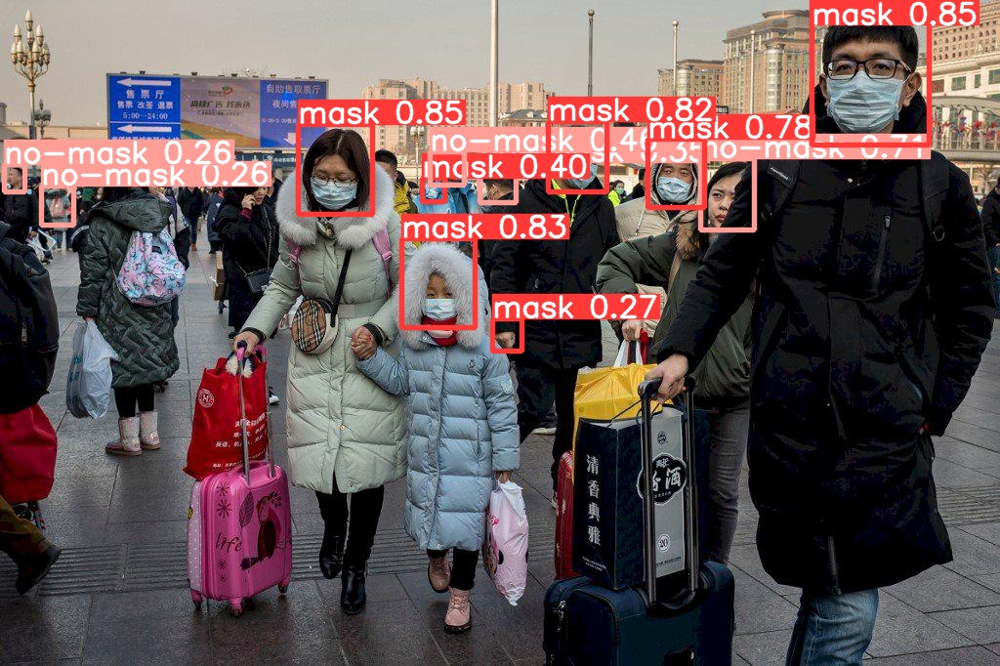

In [12]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")